In [1]:
import pandas as pd 
import numpy as np
from scipy import linalg
from scipy.spatial.distance import pdist
import networkx as nx
import sys
import random
from tqdm import tqdm

from sklearn.preprocessing import StandardScaler, normalize
from sklearn.metrics import DistanceMetric
from sklearn.metrics import pairwise_distances
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import OPTICS
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import SpectralClustering
from sklearn.metrics import confusion_matrix
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import adjusted_rand_score
from sklearn.neighbors import NearestCentroid
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import matthews_corrcoef as mcc
from sklearn.tree import plot_tree

import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from matplotlib import rcParams, cycler

In [2]:
def norm_and_pca_from_df(df):
    '''
    Function processes the data using Principal component analysis(PCA)
    Args:
        df : Dataframe 
    Returns dataframe containing rincipal component of df
    '''
    
    df_normalized = pd.DataFrame()
    cols = list(df.columns)
    df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
    
    df_pca = pd.DataFrame(PCA(n_components = 2).fit_transform(df_normalized))
    df_pca.columns = ['P1', 'P2']
    df_pca.index = df.index
    
    return df_normalized, df_pca

########################################################################################

def calculate_eigen_self_tuning(df, k):
    
    dimension = df.shape[0]
    dist_ = pdist(df)
    pd = np.zeros([dimension, dimension])
    dist = iter(dist_)
    for i in range(dimension):
        for j in range(i+1, dimension):  
            d = next(dist)
            pd[i,j] = d
            pd[j,i] = d
            
    #calculate local sigma
    sigmas = np.zeros(dimension)
    for i in tqdm(range(len(pd))):
        sigmas[i] = sorted(pd[i])[7]
    
    adjacency_matrix = np.zeros([dimension, dimension])
    dist = iter(dist_)
    for i in tqdm(range(dimension)):
        for j in range(i+1, dimension):  
            d = np.exp(-1*next(dist)**2/(sigmas[i]*sigmas[j]))
            adjacency_matrix[i,j] = d
            adjacency_matrix[j,i] = d
            
    degree_matrix = np.sum(adjacency_matrix, axis=0) * np.eye(dimension)
    
    # Normalized laplacian matrix
    d_half = linalg.fractional_matrix_power(degree_matrix, -0.5)
    laplacian_matrix_normalized = np.matmul(np.matmul(d_half, adjacency_matrix), d_half)
    
    e, v = np.linalg.eigh(laplacian_matrix_normalized)
    X = v[:, -1*k:]
    
    row_sums = X.sum(axis=1)
    Y = X / row_sums[:, np.newaxis]
            
    return X, Y

############################################################################################

In [ ]:
## Load dataset 1
df_csv = pd.read_csv("dataset_1/mp_samples.csv")
# df_graph = pd.read_csv("dataset_1/graph.csv")
df_csv.index = df_csv.Patients
df_csv_data = df_csv.iloc[:, 2:2971]
df_csv_data2 = df_csv_data.loc[:,(df_csv_data.mean() >= 300)]
df_csv_data2.shape

df_normalized, df_pca = norm_and_pca_from_df(df_csv_data)

df_pca['class_label'] = ['CD' if 'CD' in index else 'UC' if 'UC' in index else 'C' for index, patient in df_pca.iterrows()]
df_pca['class_label'] = df_pca['class_label'].astype('category').cat.codes

df_pca_control = df_pca[['P1','P2']]

In [29]:
## Load dataset 2
df_csv_data = pd.read_csv("dataset_2/all_metaproteins.csv", index_col=0)
df_csv_data2 = df_csv_data.loc[:,(df_csv_data.mean() >= 0.5)]
df_normalized, df_pca = norm_and_pca_from_df(df_csv_data)
df_pca['class_label'] = ['C' if 'C' in index else 'N' if 'N' in index else 'H' for index, patient in df_pca.iterrows()]
df_pca['class_label'] = df_pca['class_label'].astype('category').cat.codes
df_pca_control = df_pca[['P1','P2']]

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized[cols] = pd.DataFrame(normalize(StandardScaler().fit_transform(df[cols])))
C:\Users\49171\AppData\Local\Temp\ipykernel_13996\1348048754.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is u

In [30]:
df_normalized

,0,1,2,3,4,5,6,7,8,9,...,42564,42565,42566,42567,42568,42569,42570,42571,42572,42573
0,0.000602,-0.002142,-0.001217,-0.003034,0.000012,0.002786,0.002007,0.002366,0.001681,0.003067,...,-0.000433,-0.000433,-0.000433,-0.000433,-0.000433,-0.000433,0.034199,-0.000433,0.001032,0.001620
1,-0.003646,-0.005073,0.004753,-0.004685,0.004607,-0.003101,-0.004169,0.008596,0.009322,-0.000322,...,-0.000666,-0.000666,-0.000666,-0.000666,-0.000666,-0.000666,-0.000666,-0.000666,-0.001613,0.001099
2,-0.003670,-0.005001,0.002510,-0.004589,0.000489,-0.005641,-0.000151,0.002042,0.000279,0.001020,...,-0.000549,-0.000549,-0.000549,-0.000549,-0.000549,-0.000549,-0.000549,-0.000549,-0.002391,0.000029
3,-0.004674,-0.005659,-0.006702,-0.000080,-0.004555,-0.005543,-0.005129,-0.003997,-0.006569,-0.003274,...,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.011033,-0.011564
4,0.004824,-0.003444,-0.003218,-0.002277,-0.002220,-0.003053,0.010752,-0.001289,-0.001900,0.002268,...,-0.000486,-0.000486,-0.000486,-0.000486,-0.000486,-0.000486,-0.000486,-0.000486,0.001523,0.001460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,-0.005431,-0.005183,0.001781,-0.004965,0.001275,-0.004939,-0.003233,0.001908,0.002452,-0.003114,...,-0.000577,-0.000577,-0.000577,-0.000577,-0.000577,-0.000577,-0.000577,-0.000577,-0.002403,-0.000569
76,0.001283,0.004450,-0.004146,0.002966,-0.001277,0.002166,0.000324,-0.001608,-0.004650,-0.000161,...,-0.000644,-0.000644,-0.000644,-0.000644,-0.000644,-0.000644,-0.000644,-0.000644,-0.000864,0.002208
77,0.000530,0.002996,0.001871,-0.003801,0.005340,-0.002693,-0.000332,0.002701,0.001519,0.001177,...,-0.000524,-0.000524,-0.000524,-0.000524,-0.000524,-0.000524,-0.000524,-0.000524,0.002644,0.006203
78,-0.002537,-0.002952,0.002008,0.000111,0.000617,-0.001515,-0.004985,-0.001029,0.001668,-0.002261,...,-0.000614,-0.000614,-0.000614,-0.000614,-0.000614,-0.000614,-0.000614,-0.000614,-0.001066,0.004132


In [62]:
# Normalized and unnormalized eigenvalues and vectors
Xst, Yst = calculate_eigen_self_tuning(df_normalized, 6)
df_U = pd.DataFrame(Xst)
df_N = pd.DataFrame(Yst)

100%|████████████████████████████████████████████████████████████████████████████████| 80/80 [00:00<00:00, 4721.72it/s]


In [63]:
df_U.index = df_csv_data.index
df_U['class_label'] = df_pca.class_label

# index_list = ['P10_C','P11_C','P12_C','P13_C','P14_C','P15_C','P16_C','P17_C',
#               'P25_CD','P26_CD','P27_CD','P28_CD',
#               'P37_UC','P38_UC','P39_UC','P40_UC','P41_UC','P42_UC']

index_list = ['C_15','C_16','C_17','C_18','C_19',
              'N_44','N_45','N_46','N_47','N_48','N_49','N_50','N_51',
              'H_74','H_75','H_76','H_77','H_78','H_79','H_80']

train_df = df_U.loc[~ df_U.index.isin(index_list)]
test_df = df_U.loc[df_U.index.isin(index_list)]

X_train = train_df.drop(['class_label'],axis=1)
y_train = train_df[['class_label']]

X_test = test_df.drop(['class_label'],axis=1)
y_test = test_df[['class_label']]

In [64]:
X_train

,0,1,2,3,4,5
C_01,-0.036601,0.153620,-0.140660,0.026454,-0.033096,0.112098
C_02,0.025776,0.086900,-0.127482,0.000836,-0.201624,0.111215
C_03,0.089802,0.066797,-0.022288,0.008662,-0.164824,0.110940
C_04,0.121108,-0.105771,-0.105006,-0.196938,-0.039016,0.111948
C_05,0.045328,0.196696,-0.086743,0.001338,-0.070294,0.112385
C_06,0.122925,0.273956,-0.008943,0.037270,-0.225236,0.110843
C_07,0.145683,0.243925,-0.025127,0.092438,-0.149751,0.111576
C_08,-0.032431,0.107368,-0.105090,-0.016051,-0.188492,0.110811
C_09,-0.013848,0.127322,-0.153499,0.111682,-0.229398,0.110240
C_10,0.024793,0.173588,-0.126254,-0.023796,-0.188534,0.111145


In [65]:
classifier0 = NearestCentroid()
classifier0.fit(X_train, y_train.values.ravel())
print(classifier0.score(X_test, y_test), mcc(classifier0.predict(X_test), y_test))

0.6 0.38938264864400046


In [66]:
classifier1 = KNeighborsClassifier(n_neighbors=5)
classifier1.fit(X_train, y_train.values.ravel())
print(classifier1.score(X_test, y_test), mcc(classifier1.predict(X_test), y_test))

0.55 0.33585969247699354


In [67]:
classifier2 = DecisionTreeClassifier(criterion = "gini")
classifier2.fit(X_train, y_train)
print(classifier2.score(X_test, y_test), mcc(classifier2.predict(X_test), y_test))

0.7 0.543576768128138


[Text(0.31547619047619047, 0.9375, 'X[4] <= -0.12\ngini = 0.651\nsamples = 60\nvalue = [14, 22, 24]'),
 Text(0.11904761904761904, 0.8125, 'X[0] <= -0.109\ngini = 0.165\nsamples = 11\nvalue = [10, 0, 1]'),
 Text(0.07142857142857142, 0.6875, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1]'),
 Text(0.16666666666666666, 0.6875, 'gini = 0.0\nsamples = 10\nvalue = [10, 0, 0]'),
 Text(0.5119047619047619, 0.8125, 'X[1] <= 0.049\ngini = 0.571\nsamples = 49\nvalue = [4, 22, 23]'),
 Text(0.2619047619047619, 0.6875, 'X[5] <= 0.112\ngini = 0.5\nsamples = 33\nvalue = [1, 20, 12]'),
 Text(0.09523809523809523, 0.5625, 'X[3] <= -0.136\ngini = 0.272\nsamples = 13\nvalue = [1, 11, 1]'),
 Text(0.047619047619047616, 0.4375, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0]'),
 Text(0.14285714285714285, 0.4375, 'X[1] <= 0.039\ngini = 0.153\nsamples = 12\nvalue = [0, 11, 1]'),
 Text(0.09523809523809523, 0.3125, 'gini = 0.0\nsamples = 10\nvalue = [0, 10, 0]'),
 Text(0.19047619047619047, 0.3125, 'X[0] <= 0.059\ngini = 0

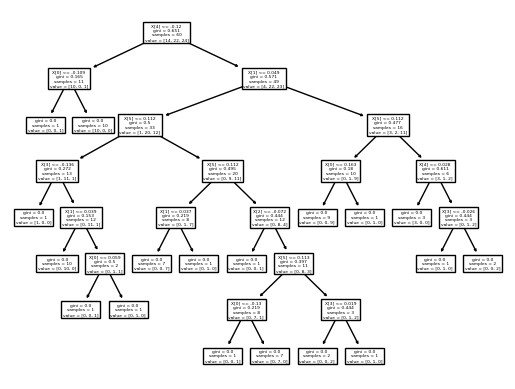

In [68]:
plot_tree(classifier2)